In [8]:
# Install the Ultralytics Package for YOLO
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.3/887.3 kB 33.0 MB/s eta 0:00:00


In [57]:
# Import Necessary Libraries
import ultralytics
from ultralytics import YOLO
from IPython.display import Image
import glob
import os
from IPython.display import HTML
from base64 import b64encode

In [58]:
# Verify YOLO Installation
ultralytics.checks()

Ultralytics 8.3.36 🚀 Python-3.10.12 torch-2.5.1+cpu CPU (Intel Xeon 2.00GHz)
Setup complete ✅ (96 CPUs, 334.6 GB RAM, 15.8/225.3 GB disk)


In [59]:
# Install Roboflow for Dataset Integration
!pip install roboflow

In [61]:
# Download Dataset from Roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="7QIUUBiHa7491qJ1ns3e")
project = rf.workspace("bike-helmets").project("bike-helmet-detection-2vdjo")
version = project.version(2)
dataset = version.download("yolov11")


loading Roboflow workspace...
loading Roboflow project...


In [62]:
# Define Paths
data_yaml_path = f"{dataset.location}/data.yaml"

In [ ]:
# Train YOLO11 Model
!yolo task=detect mode=train data=data_yaml_path model="yolo11n.pt" epochs=40 imgsz=640

Ultralytics 8.3.36 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/Bike-Helmet-Detection-2/data.yaml, epochs=40, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf

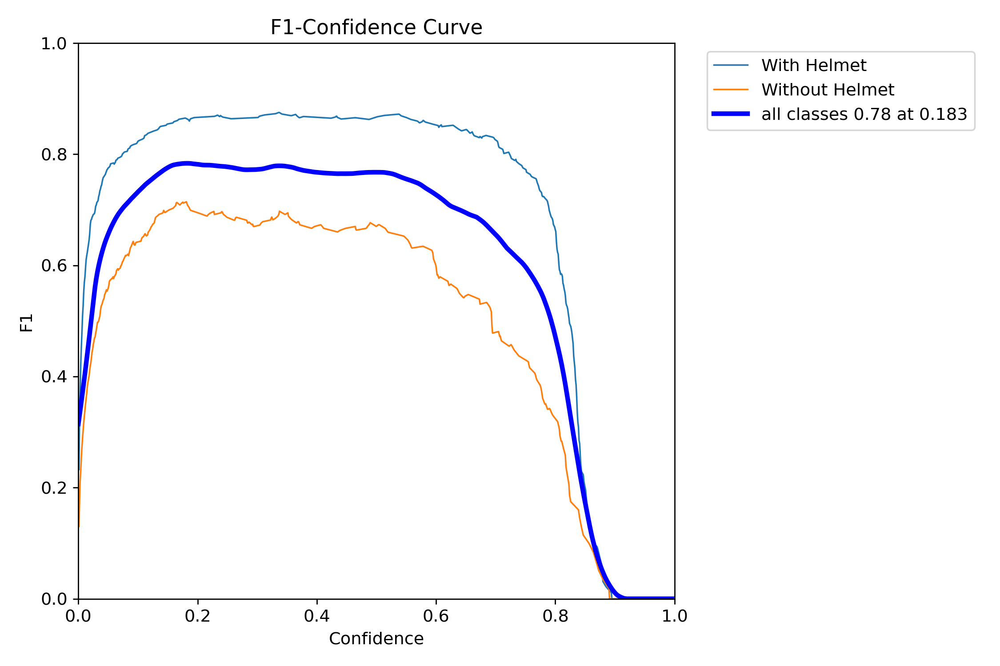

In [31]:
# Visualize Training Results

Image("/content/runs/detect/val2/F1_curve.png", width=600)

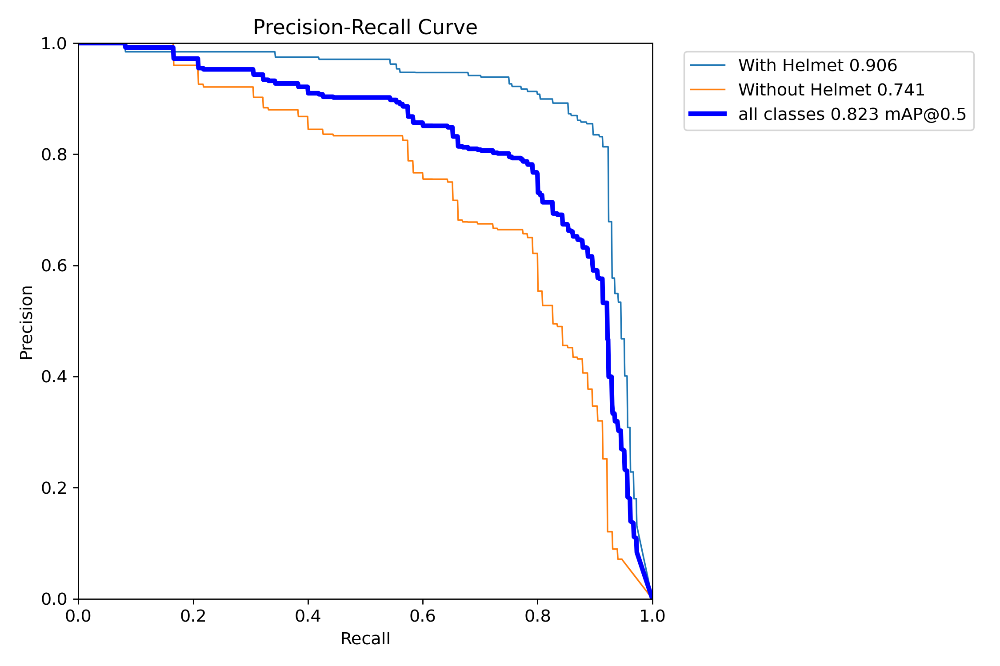

In [32]:
Image("/content/runs/detect/val2/PR_curve.png", width=600)

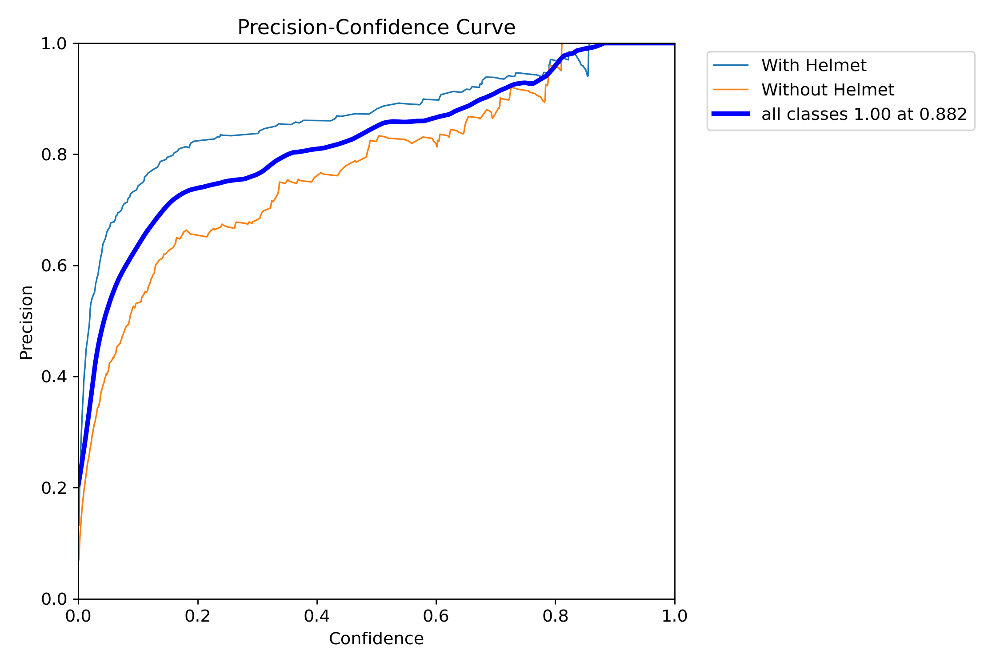

In [33]:
Image("/content/runs/detect/val2/P_curve.png", width=600)

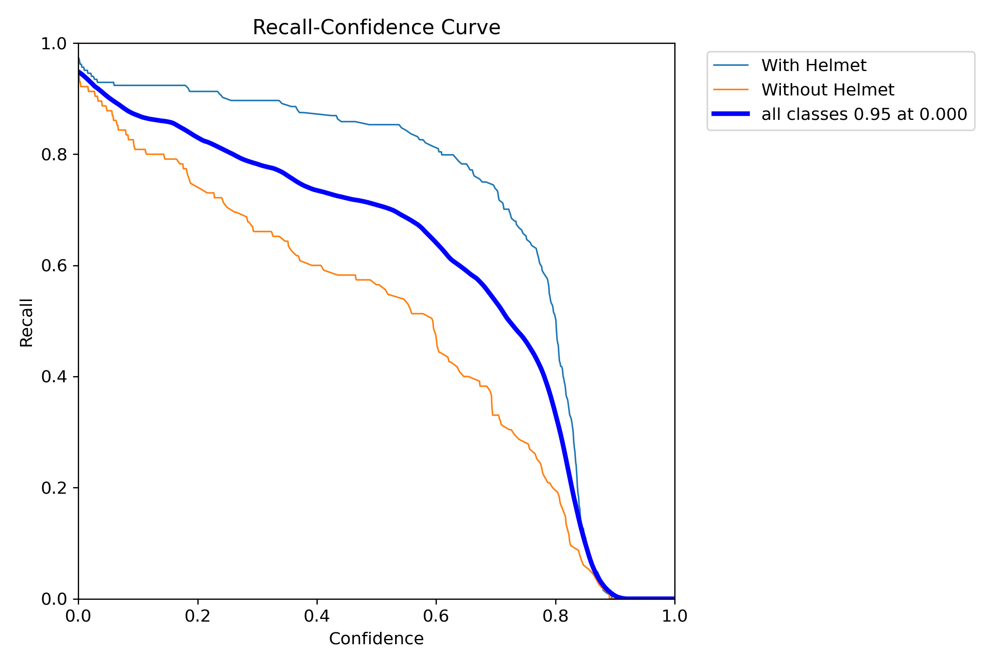

In [34]:
Image("/content/runs/detect/val2/R_curve.png", width=600)

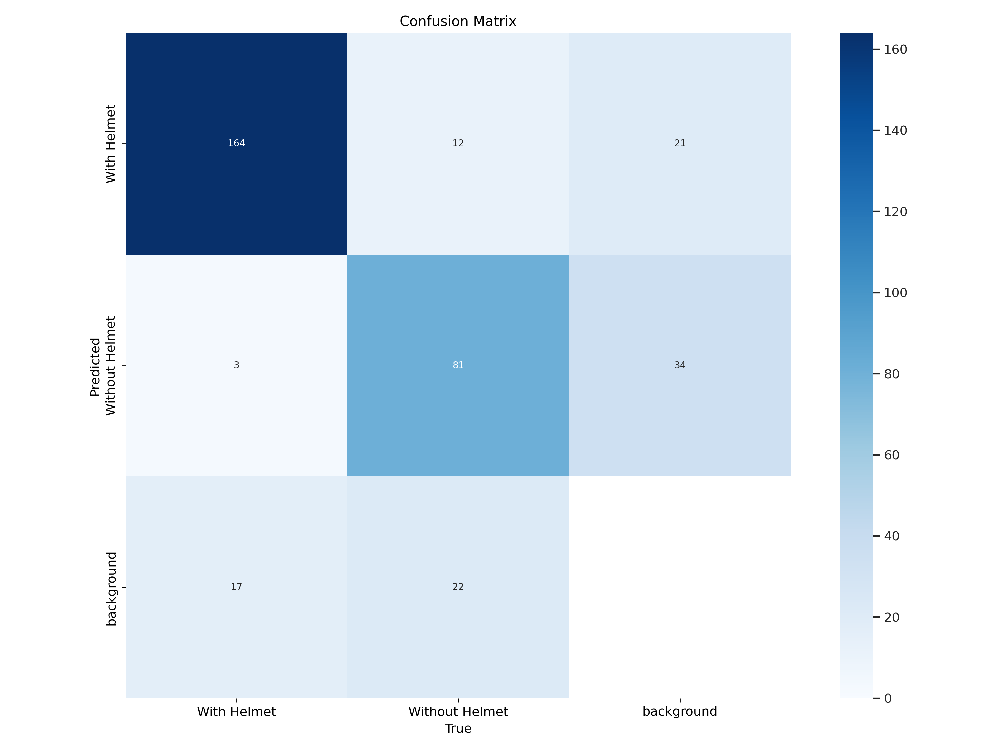

In [35]:
Image("/content/runs/detect/val2/confusion_matrix.png", width=600)

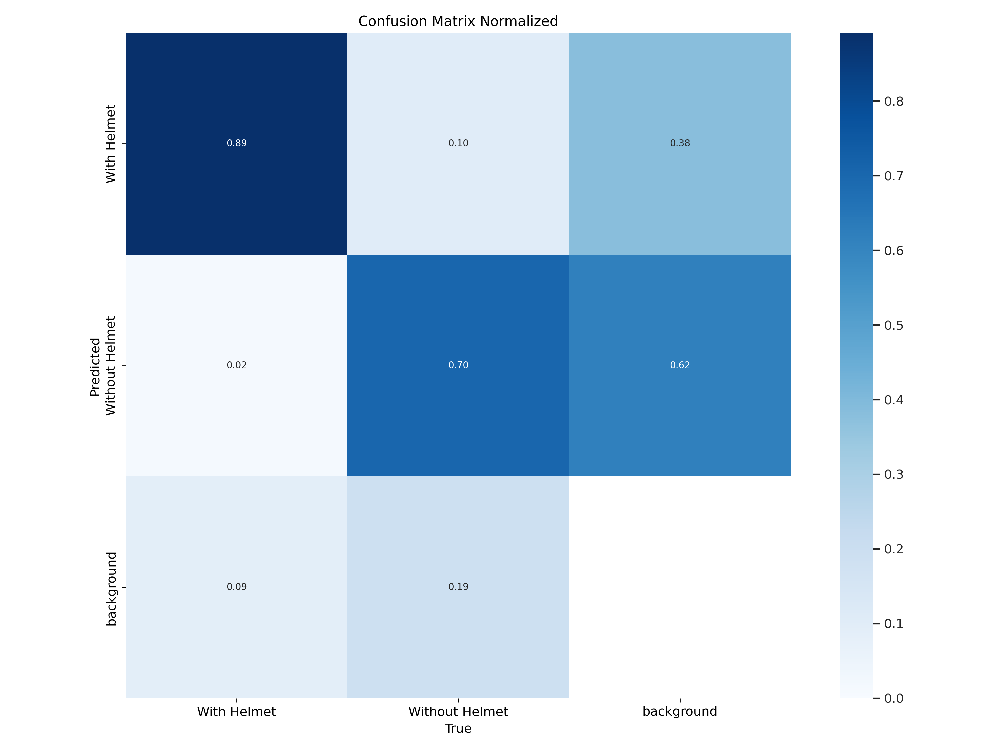

In [36]:
Image("/content/runs/detect/val2/confusion_matrix_normalized.png", width=600)

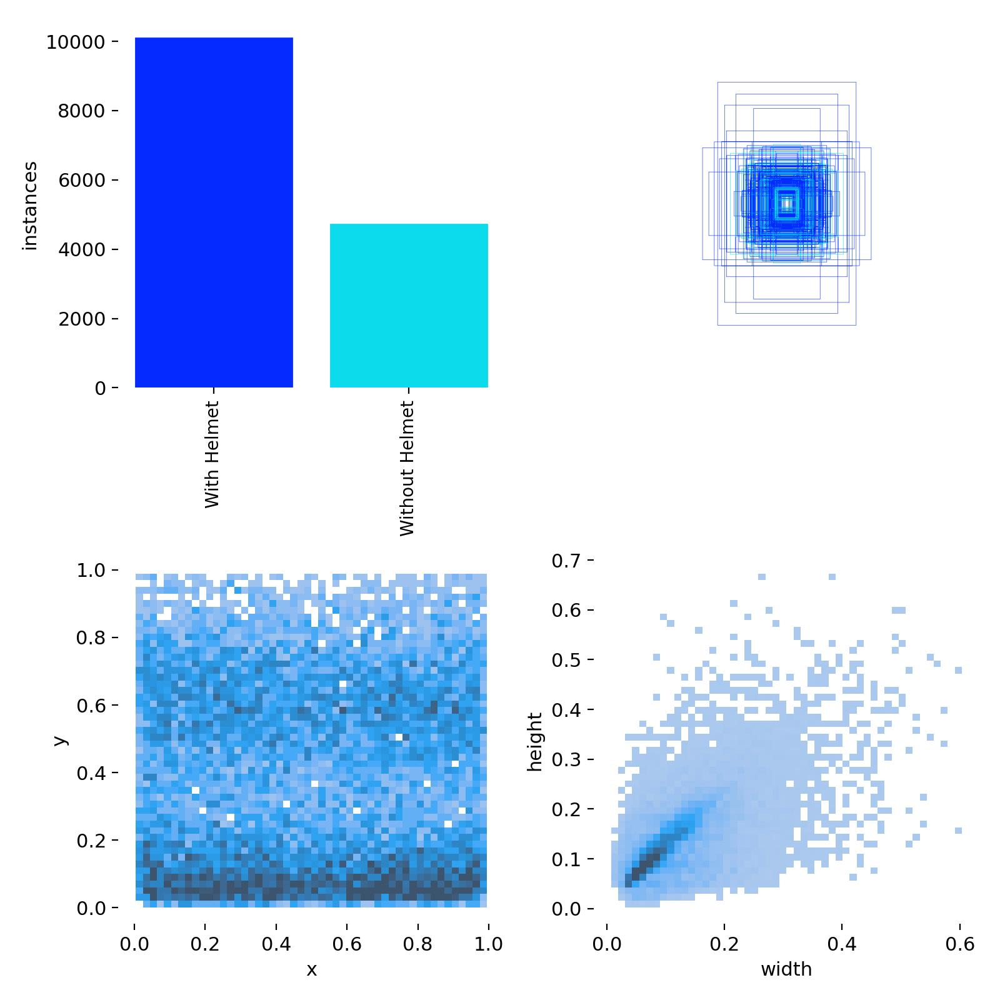

In [39]:
Image("/content/runs/detect/train/labels.jpg", width=600)

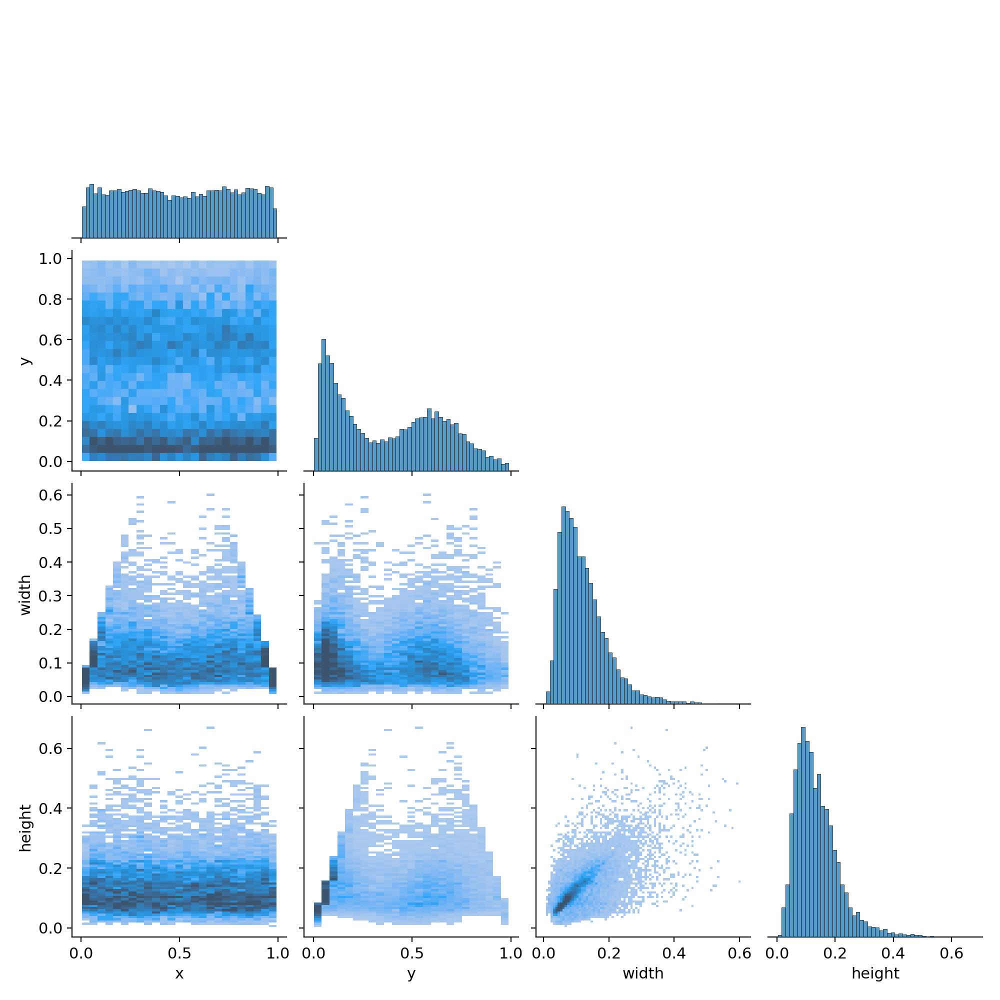

In [7]:
Image("/content/runs/detect/train/labels_correlogram.jpg", width=600)

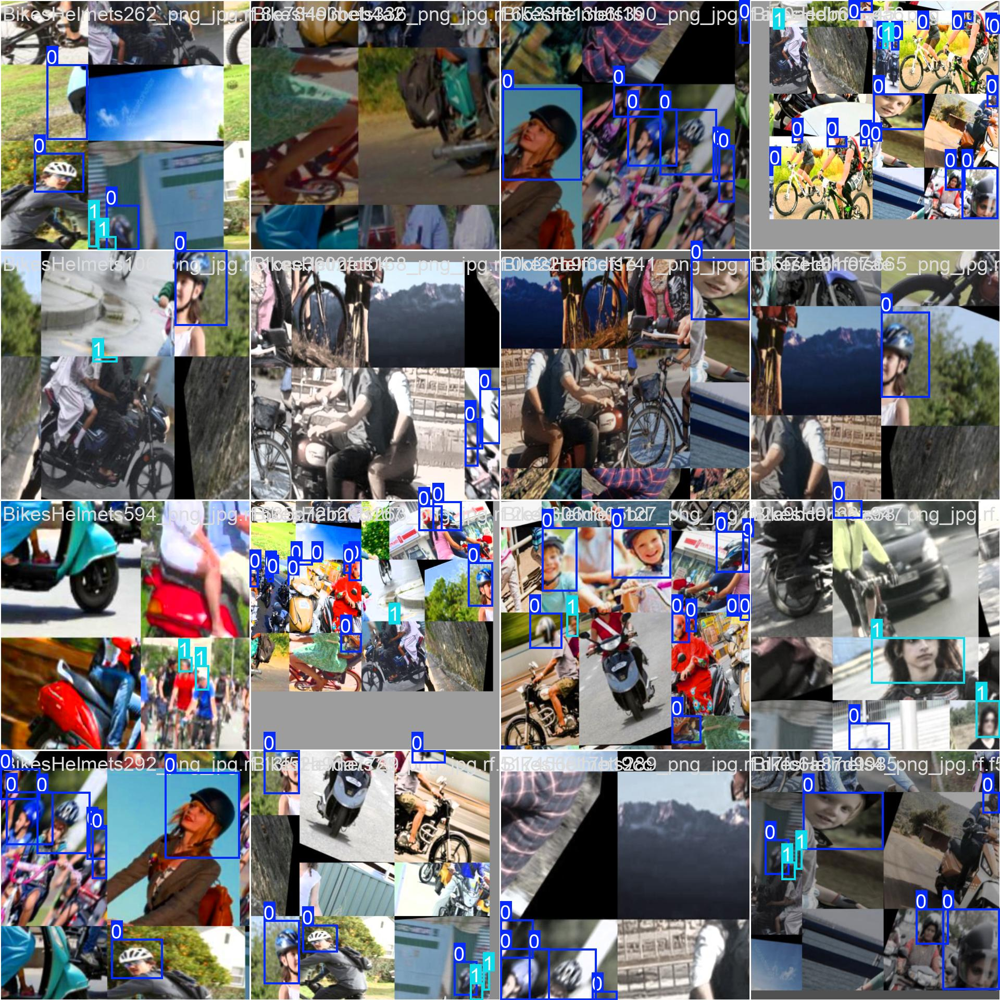

In [11]:
Image("/content/runs/detect/train/train_batch0.jpg", width=600)

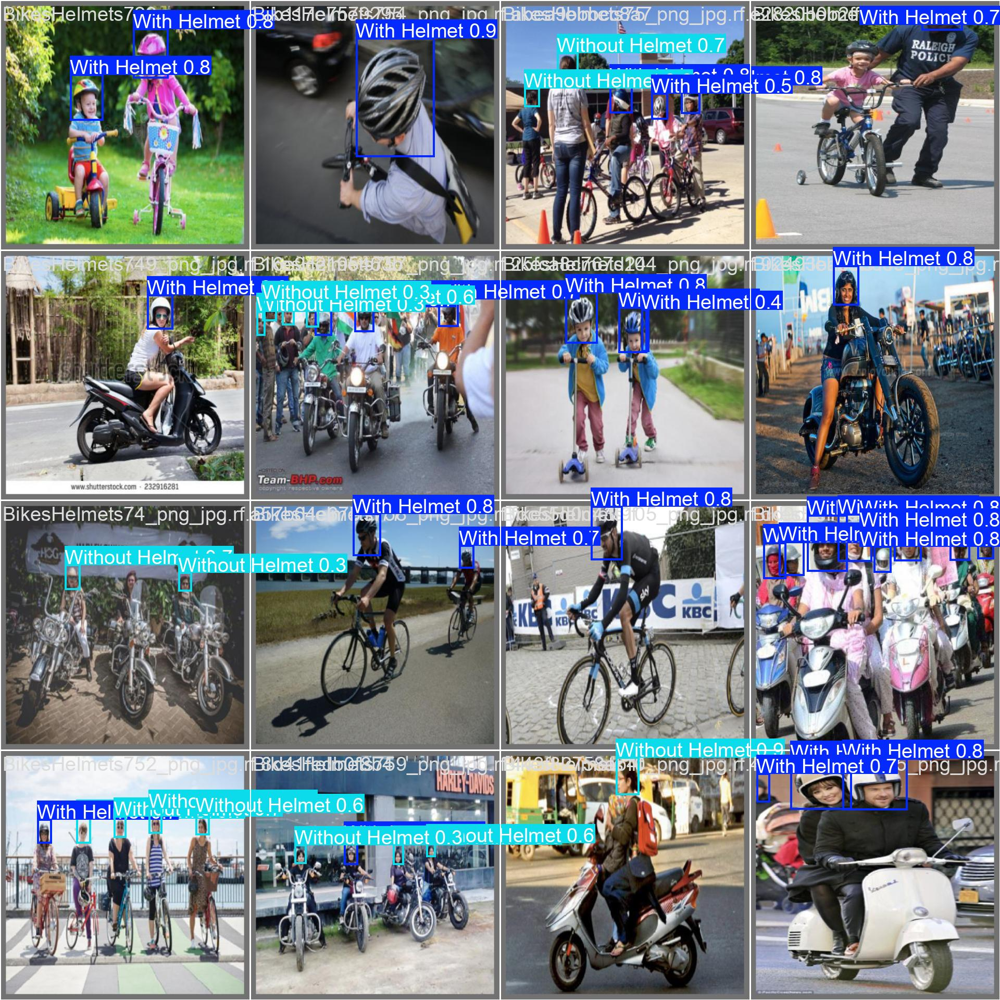

In [43]:
Image("/content/runs/detect/val2/val_batch0_pred.jpg", width=600)

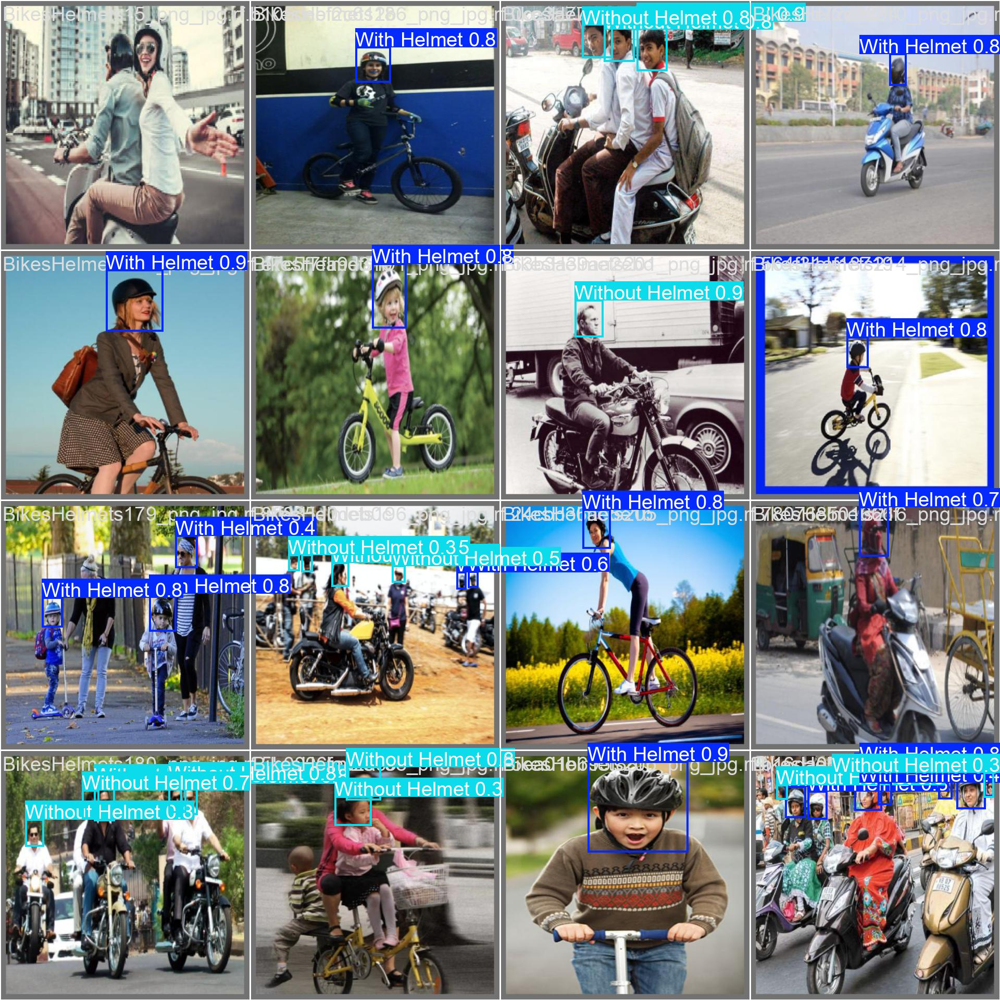

In [44]:
Image("/content/runs/detect/val2/val_batch1_pred.jpg", width=600)

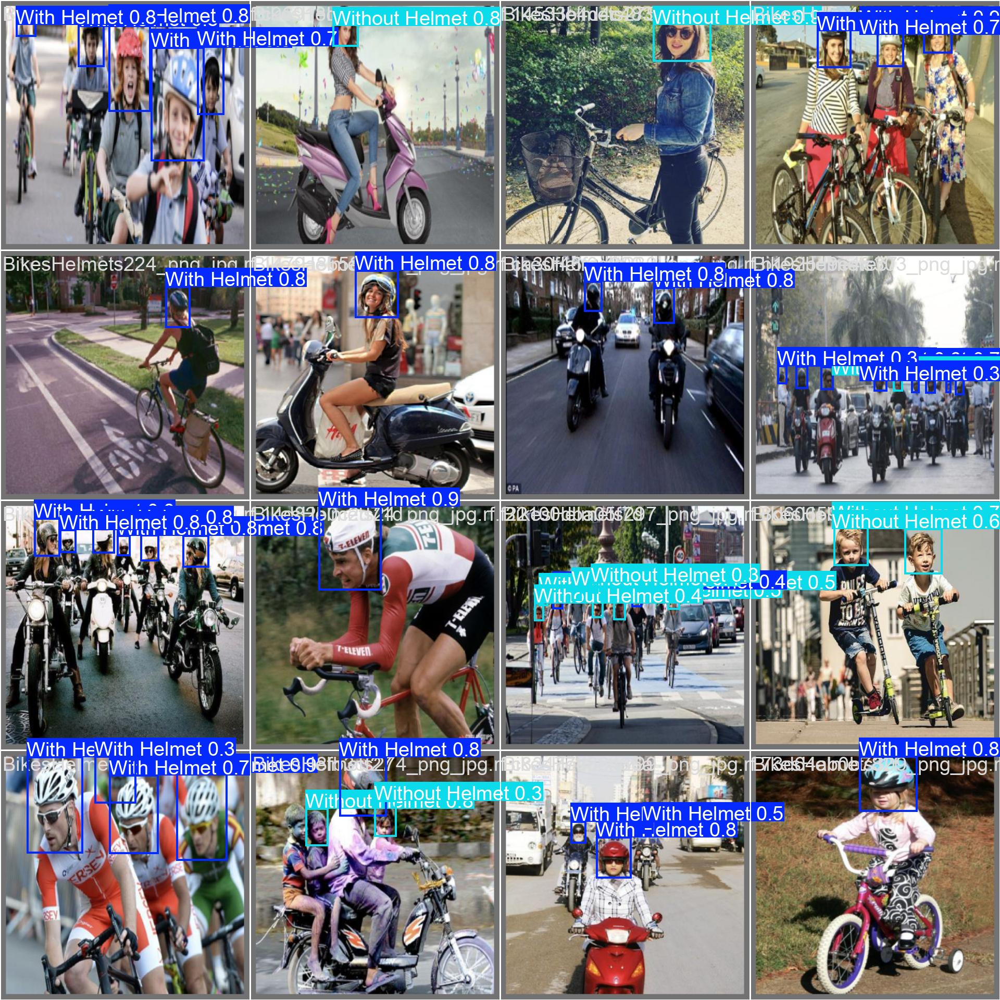

In [45]:
Image("/content/runs/detect/val2/val_batch2_pred.jpg", width=600)

In [63]:
# Validate the Fine-Tuned Model
!yolo task=detect mode=val model="best.pt" data={data_yaml_path}

Ultralytics 8.3.36 🚀 Python-3.10.12 torch-2.5.1+cpu CPU (Intel Xeon 2.00GHz)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs
val: Scanning /content/Bike-Helmet-Detection-2/valid/labels.cache... 126 images, 0 backgrounds, 0 corrupt: 100% 126/126 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 8/8 [00:06<00:00,  1.26it/s]
                   all        126        299      0.739      0.827      0.823      0.393
           With Helmet         88        184      0.824      0.913      0.906      0.452
        Without Helmet         53        115      0.654      0.741      0.741      0.334
Speed: 1.4ms preprocess, 43.5ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/val3
💡 Learn more at https://docs.ultralytics.com/modes/val


In [64]:
# Run Inference with Custom Model on Test Images
!yolo task=detect mode=predict model=best.pt conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.36 🚀 Python-3.10.12 torch-2.5.1+cpu CPU (Intel Xeon 2.00GHz)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs

image 1/63 /content/Bike-Helmet-Detection-2/test/images/BikesHelmets102_png_jpg.rf.6bc6d292ee31801b348ecd1b3ff56e58.jpg: 640x640 2 With Helmets, 96.8ms
image 2/63 /content/Bike-Helmet-Detection-2/test/images/BikesHelmets150_png_jpg.rf.347400d070a36faf53bd1ace27a3dd43.jpg: 640x640 3 With Helmets, 2 Without Helmets, 58.4ms
image 3/63 /content/Bike-Helmet-Detection-2/test/images/BikesHelmets162_png_jpg.rf.afa7afdd78e5dd465e07020c8f6f8743.jpg: 640x640 (no detections), 59.8ms
image 4/63 /content/Bike-Helmet-Detection-2/test/images/BikesHelmets163_png_jpg.rf.bc2e75700813e81ee03981e79151f0ac.jpg: 640x640 5 With Helmets, 1 Without Helmet, 56.7ms
image 5/63 /content/Bike-Helmet-Detection-2/test/images/BikesHelmets176_png_jpg.rf.80db740fa43cad753ab10b2c62fa7bc6.jpg: 640x640 2 Without Helmets, 52.3ms
image 6/63 /content/Bike-Helmet-Detect

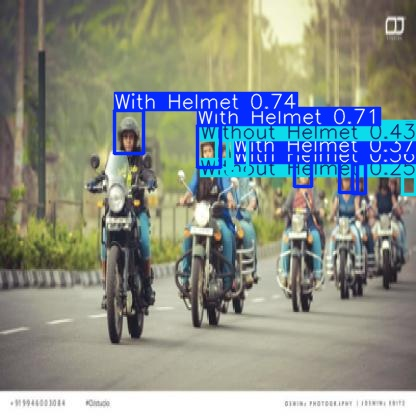

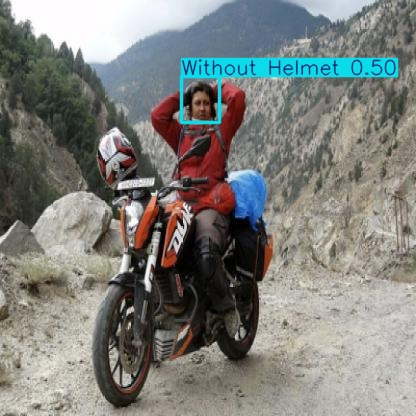

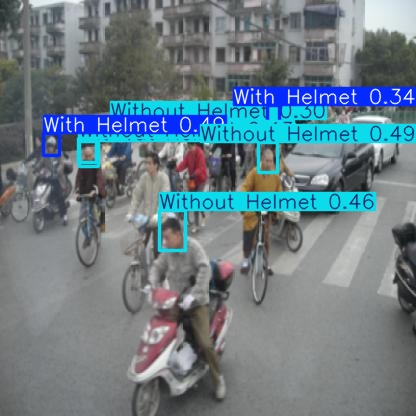

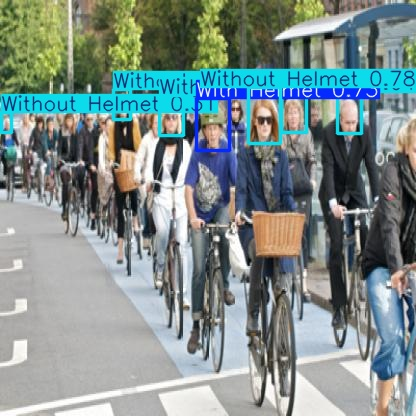

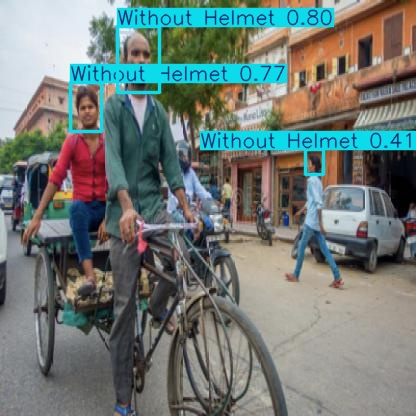

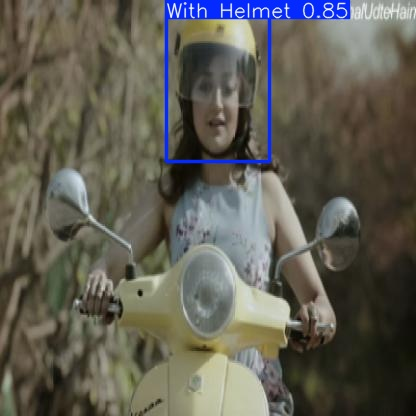

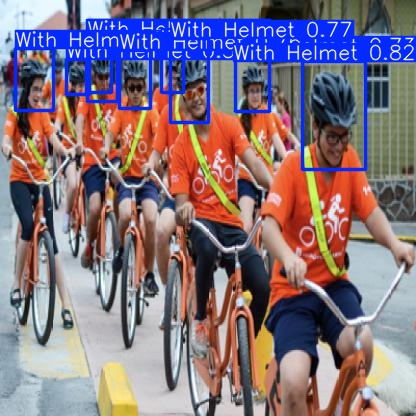

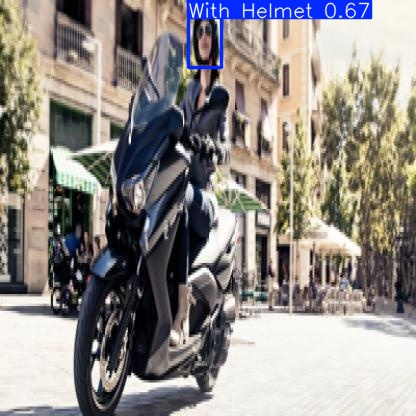

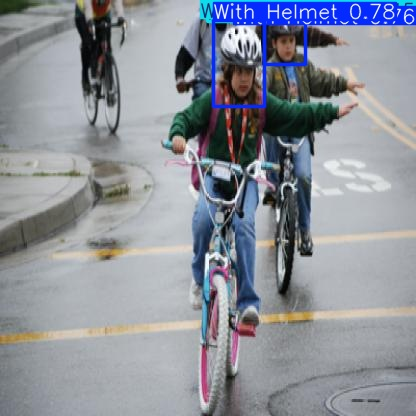

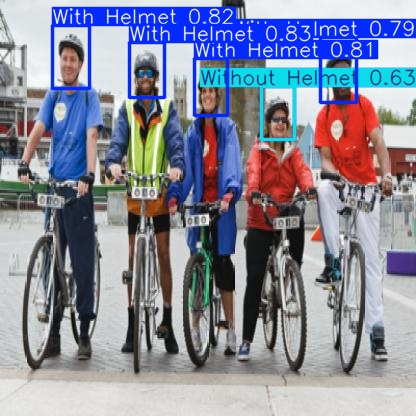

In [28]:
# Display Predictions on Test Images
latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[0:10]:
    display(IPyImage(filename=img, width=600))
    print("\n")

In [48]:
# Run Inference with Custom Model on a Specific Image
!yolo task=detect mode=predict model=best.pt conf=0.25 source="indian_bikes.jpg" save=True

Ultralytics 8.3.36 🚀 Python-3.10.12 torch-2.5.1+cpu CPU (Intel Xeon 2.00GHz)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /content/indian_bikes.jpg: 352x640 8 With Helmets, 1 Without Helmet, 90.8ms
Speed: 2.4ms preprocess, 90.8ms inference, 1.4ms postprocess per image at shape (1, 3, 352, 640)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


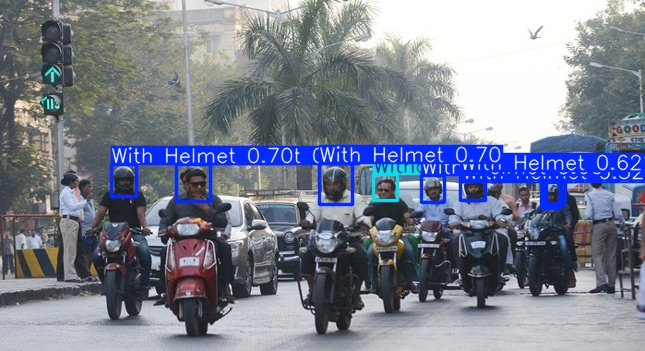

In [51]:
Image("/content/runs/detect/predict3/indian_bikes.jpg", width=800)

In [53]:
# Inference with Custom Model on Videos
!yolo task=detect mode=predict model= best.pt conf=0.25 source="bikes_on_roads.mp4" save=True

Ultralytics 8.3.36 🚀 Python-3.10.12 torch-2.5.1+cpu CPU (Intel Xeon 2.00GHz)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/432) /content/bikes_on_roads.mp4: 384x640 3 With Helmets, 76.4ms
video 1/1 (frame 2/432) /content/bikes_on_roads.mp4: 384x640 3 With Helmets, 47.7ms
video 1/1 (frame 3/432) /content/bikes_on_roads.mp4: 384x640 4 With Helmets, 1 Without Helmet, 46.9ms
video 1/1 (frame 4/432) /content/bikes_on_roads.mp4: 384x640 2 With Helmets, 1 Without Helmet, 46.1ms
video 1/1 (frame 5/432) /content/bikes_on_roads.mp4: 384x640 2 With Helmets, 1 Without Helmet, 45.3ms
video 1/1 (frame 6/432) /content/bikes_on_roads.mp4: 384x640 3 With Helmets, 2 Without Helmets, 45.1ms
video 1/1 (frame 7/432) /content/bikes_on_roads.mp4: 384x640 3 With Helmets, 1 Without Helmet, 46.4ms
video 1/1 (frame 8/432) /content/bikes_on_roads.mp4: 384x640 2 With Helmets, 1 Without Helmet, 42.7ms
video 1/1 (frame 9/432) /content/bikes_on_roads.mp4: 384x6

In [65]:
# Compress Video Output for Display
save_path = '/content/runs/detect/predict4/bikes_on_roads.avi'
compressed_path = "/content/result_compressed.mp4"
os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

256

In [66]:
# Display Compressed Video
mp4 = open(compressed_path, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=400 controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")

Deployment

In [1]:
!pip install --force-reinstall --ignore-installed flask flask-ngrok blinker


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.0/103.0 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.9/97.9 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.3/133.3 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.3/167.3 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.8/144.8 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.4/70.4 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.3/126.3 kB 8.2 MB/s eta 0:00:00


In [2]:
!pip show flask flask-ngrok blinker


Name: Flask
Version: 3.0.3
Summary: A simple framework for building complex web applications.
Home-page: 
Author: 
Author-email: 
License: 
Location: /usr/local/lib/python3.10/dist-packages
Requires: blinker, click, itsdangerous, Jinja2, Werkzeug
Required-by: community, flask-ngrok
---
Name: flask-ngrok
Version: 0.0.25
Summary: A simple way to demo Flask apps from your machine.
Home-page: https://github.com/gstaff/flask-ngrok
Author: Grant Stafford
Author-email: 
License: UNKNOWN
Location: /usr/local/lib/python3.10/dist-packages
Requires: Flask, requests
Required-by: 
---
Name: blinker
Version: 1.9.0
Summary: Fast, simple object-to-object and broadcast signaling
Home-page: 
Author: Jason Kirtland
Author-email: 
License: 
Location: /usr/local/lib/python3.10/dist-packages
Requires: 
Required-by: Flask


In [3]:
!pip install pyngrok


In [23]:
from flask import Flask, request
from pyngrok import ngrok
from ultralytics import YOLO
import os
import shutil
import glob

# Initialize Flask App
app = Flask(__name__)

app.config["UPLOAD_FOLDER"] = "static/uploads"  # Folder to save uploaded files
app.config["DETECT_FOLDER"] = "static/detections"  # Folder to save detection results

# Create folders if they do not exist
os.makedirs(app.config["UPLOAD_FOLDER"], exist_ok=True)
os.makedirs(app.config["DETECT_FOLDER"], exist_ok=True)

# Load YOLO Model
model = YOLO('best.pt')

@app.route("/")
def index():
    """Render the homepage."""
    return """
    <!DOCTYPE html>
    <html lang="en">
    <head>
        <meta charset="UTF-8">
        <meta name="viewport" content="width=device-width, initial-scale=1.0">
        <title>YOLO Object Detection</title>
    </head>
    <body>
        <h1>YOLO Object Detection</h1>
        <form action="/upload" method="post" enctype="multipart/form-data">
            <label for="file">Upload an Image or Video:</label>
            <input type="file" name="file" id="file" required>
            <button type="submit">Submit</button>
        </form>
    </body>
    </html>
    """

@app.route("/upload", methods=["POST"])
def upload():
    """Handle file upload and run YOLO inference."""
    if "file" not in request.files:
        return "No file uploaded!", 400

    file = request.files["file"]
    if file.filename == "":
        return "No file selected!", 400

    # Save the uploaded file
    upload_path = os.path.join(app.config["UPLOAD_FOLDER"], file.filename)
    file.save(upload_path)

    # Check file type (image or video) by extension
    file_ext = file.filename.split(".")[-1].lower()
    is_video = file_ext in ["mp4", "avi", "mov", "mkv"]

    # Run YOLO inference
    results = model.predict(source=upload_path, save=True, save_txt=False, save_conf=True)

    # Get the latest prediction folder
    runs_path = os.path.join("runs", "detect")
    all_folders = sorted(glob.glob(os.path.join(runs_path, "predict*")), key=os.path.getmtime, reverse=True)

    if not all_folders:
        return "Prediction failed. No output found!", 500

    latest_folder = all_folders[0]  # Latest prediction folder

    if is_video:
        # Find the output video file
        predicted_files = glob.glob(os.path.join(latest_folder, "*.mp4")) + \
                          glob.glob(os.path.join(latest_folder, "*.avi"))
        if not predicted_files:
            return "Prediction failed. No output video found!", 500

        predicted_video_path = predicted_files[0]

        # Move the predicted video to the detection folder
        detection_path = os.path.join(app.config["DETECT_FOLDER"], file.filename)
        shutil.copy(predicted_video_path, detection_path)

        return f"""
        <!DOCTYPE html>
        <html lang="en">
        <head>
            <meta charset="UTF-8">
            <meta name="viewport" content="width=device-width, initial-scale=1.0">
            <title>YOLO Detection Result</title>
        </head>
        <body>
            <h1>Detection Result</h1>
            <h2>Uploaded Video:</h2>
            <video controls style="max-width:100%;height:auto;">
                <source src="/static/uploads/{file.filename}" type="video/{file_ext}">
                Your browser does not support the video tag.
            </video>
            <h2>Detection Output:</h2>
            <video controls style="max-width:100%;height:auto;">
                <source src="/static/detections/{file.filename}" type="video/{file_ext}">
                Your browser does not support the video tag.
            </video>
            <br>
            <a href="/">Upload Another File</a>
        </body>
        </html>
        """
    else:
        # Find the output image file
        predicted_files = glob.glob(os.path.join(latest_folder, "*.jpg")) + \
                          glob.glob(os.path.join(latest_folder, "*.png"))
        if not predicted_files:
            return "Prediction failed. No output image found!", 500

        predicted_image_path = predicted_files[0]

        # Move the predicted image to the detection folder
        detection_path = os.path.join(app.config["DETECT_FOLDER"], file.filename)
        shutil.copy(predicted_image_path, detection_path)

        return f"""
        <!DOCTYPE html>
        <html lang="en">
        <head>
            <meta charset="UTF-8">
            <meta name="viewport" content="width=device-width, initial-scale=1.0">
            <title>YOLO Detection Result</title>
        </head>
        <body>
            <h1>Detection Result</h1>
            <h2>Uploaded Image:</h2>
            <img src="/static/uploads/{file.filename}" alt="Uploaded Image" style="max-width:100%;height:auto;">
            <h2>Detection Output:</h2>
            <img src="/static/detections/{file.filename}" alt="Detection Result" style="max-width:100%;height:auto;">
            <br>
            <a href="/">Upload Another File</a>
        </body>
        </html>
        """

# Start ngrok tunnel
public_url = ngrok.connect(5000)
print("ngrok tunnel URL:", public_url)

if __name__ == "__main__":
    app.run()


ngrok tunnel URL: NgrokTunnel: "https://0c8d-35-204-69-68.ngrok-free.app" -> "http://localhost:5000"
 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
